<a href="https://colab.research.google.com/github/msemihyasa/Semih/blob/main/244329037_Mehmet_Semih_Yasa_Sayisal_Goruntu_Isleme_Final_ipynb_adl%C4%B1_not_defterinin_kopyas%C4%B1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# ÜSKÜDAR ÜNİVERSİTESİ
## Sayısal Görüntü İşleme Dersi - Final Ödevi

**Konu:** ISIC 2018 Deri Lezyonu Görüntülerinde ROI Segmentasyonu + Öznitelik Çıkarımı

**Amaç:** Her görüntü için tek bir ROI (lezyon bölgesi) elde etmek ve bu ROI üzerinden öznitelik (feature) seti üretmek.

---

## Kütüphanelerin Yüklenmesi

In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
import pandas as pd
from skimage.feature import graycomatrix, graycoprops
from skimage.measure import label, regionprops
from skimage import img_as_ubyte
from skimage.filters import threshold_otsu, threshold_triangle, threshold_minimum, try_all_threshold
from scipy.stats import skew, kurtosis
import random
from collections import Counter
import warnings
warnings.filterwarnings('ignore')

print("Kütüphaneler başarıyla yüklendi!")

Kütüphaneler başarıyla yüklendi!


## Konfigürasyon ve Yardımcı Fonksiyonlar

In [80]:
DATA_DIR = r"/content/drive/MyDrive/data/Skin cancer ISIC The International Skin Imaging Collaboration"
OUTPUT_DIR = "/content/output_results"
NUM_SAMPLES = 9  # istenen görselleştirme sayısı

if not os.path.exists(OUTPUT_DIR):
    os.makedirs(OUTPUT_DIR)

print(f"Veri dizini: {DATA_DIR}")
print(f"Çıktı dizini: {OUTPUT_DIR}")


Veri dizini: /content/drive/MyDrive/data/Skin cancer ISIC The International Skin Imaging Collaboration
Çıktı dizini: /content/output_results


In [65]:
# --- YARDIMCI FONKSİYONLAR ---

def show_images(images, titles, figsize=(15, 5), main_title=None):
    """Yan yana görüntüleri görselleştirme."""
    n = len(images)
    fig, axes = plt.subplots(1, n, figsize=figsize)
    if n == 1:
        axes = [axes]

    for ax, img, title in zip(axes, images, titles):
        if len(img.shape) == 2:  # Grayscale
            ax.imshow(img, cmap='gray')
        else:
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        ax.set_title(title, fontsize=10)
        ax.axis('off')

    if main_title:
        fig.suptitle(main_title, fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.show()

def show_histogram_comparison(img_before, img_after, title_before, title_after):
    """Histogram karşılaştırması ile görselleştirme."""
    fig, axes = plt.subplots(2, 2, figsize=(12, 8))

    # Önceki görüntü
    axes[0, 0].imshow(img_before, cmap='gray')
    axes[0, 0].set_title(title_before)
    axes[0, 0].axis('off')

    # Önceki histogram
    axes[0, 1].hist(img_before.ravel(), bins=256, range=(0, 256), color='blue', alpha=0.7)
    axes[0, 1].set_title(f'{title_before} - Histogram')
    axes[0, 1].set_xlabel('Piksel Değeri')
    axes[0, 1].set_ylabel('Frekans')

    # Sonraki görüntü
    axes[1, 0].imshow(img_after, cmap='gray')
    axes[1, 0].set_title(title_after)
    axes[1, 0].axis('off')

    # Sonraki histogram
    axes[1, 1].hist(img_after.ravel(), bins=256, range=(0, 256), color='green', alpha=0.7)
    axes[1, 1].set_title(f'{title_after} - Histogram')
    axes[1, 1].set_xlabel('Piksel Değeri')
    axes[1, 1].set_ylabel('Frekans')

    plt.tight_layout()
    plt.show()

## Veri Setinin Yüklenmesi

In [70]:
def load_dataset(DATA_DIR, num_samples=9):
    """Veri setini yükler. Örnekleri ve tüm yolları döndürür."""
    all_image_paths = []

    for data_split_name in os.listdir(DATA_DIR):
        data_split_dir = os.path.join(DATA_DIR, data_split_name)
        if os.path.isdir(data_split_dir):
            for class_name in os.listdir(data_split_dir):
                class_dir = os.path.join(data_split_dir, class_name)
                if os.path.isdir(class_dir):
                    images = glob.glob(os.path.join(class_dir, "*.jpg")) + glob.glob(os.path.join(class_dir, "*.png"))
                    for img_path in images:
                        all_image_paths.append((img_path, class_name))

    print("=" * 60)
    print("VERİ SETİ BİLGİSİ")
    print("=" * 60)
    print(f"Toplam görüntü sayısı: {len(all_image_paths)}")

    # Sınıf dağılımı
    class_counts = Counter([label for _, label in all_image_paths])
    print(f"\nSınıf dağılımı:")
    for cls, count in sorted(class_counts.items()):
        print(f"  - {cls}: {count} görüntü")

    # Rastgele örnekler seç
    if len(all_image_paths) >= num_samples:
        samples = random.sample(all_image_paths, num_samples)
    else:
        samples = all_image_paths

    return all_image_paths, samples

# Veri setini yükle
all_paths, samples = load_dataset(DATA_DIR, num_samples=NUM_SAMPLES)


VERİ SETİ BİLGİSİ
Toplam görüntü sayısı: 2357

Sınıf dağılımı:
  - actinic keratosis: 130 görüntü
  - basal cell carcinoma: 392 görüntü
  - dermatofibroma: 111 görüntü
  - melanoma: 454 görüntü
  - nevus: 373 görüntü
  - pigmented benign keratosis: 478 görüntü
  - seborrheic keratosis: 80 görüntü
  - squamous cell carcinoma: 197 görüntü
  - vascular lesion: 142 görüntü


In [46]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


---
# ADIM 1: RGB → GRAYSCALE DÖNÜŞÜMÜ

Her görüntü RGB formatından Grayscale formatına dönüştürülür. Bu dönüşüm ile renk bilgisi kaybedilir ancak yoğunluk bilgisi korunarak segmentasyon işlemi kolaylaştırılır.

In [47]:
def rgb_to_gray(image_bgr):
    """BGR görüntüyü Grayscale'e dönüştürür."""
    return cv2.cvtColor(image_bgr, cv2.COLOR_BGR2GRAY)

ADIM 1: RGB → GRAYSCALE DÖNÜŞÜMÜ


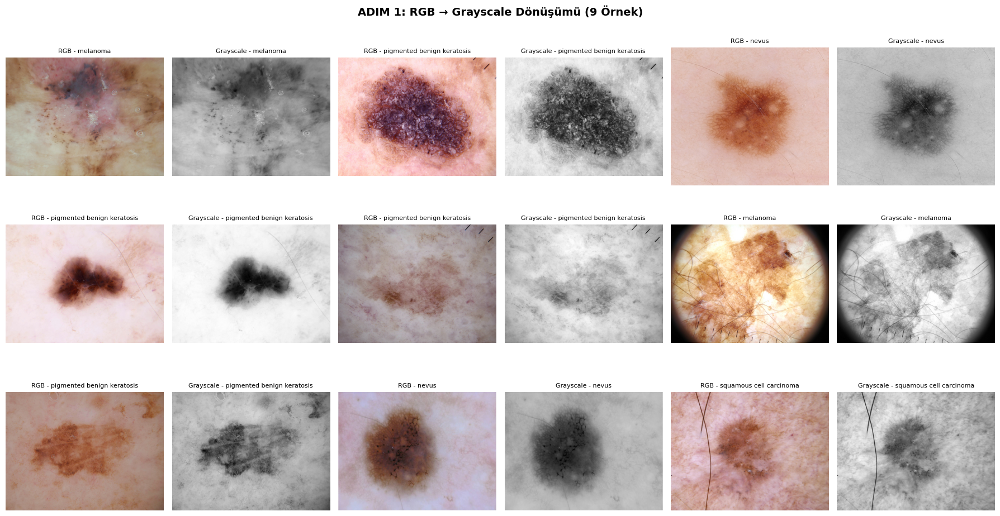

In [73]:
# RGB → Grayscale Görselleştirmesi (9 Örnek)
print("ADIM 1: RGB → GRAYSCALE DÖNÜŞÜMÜ")
print("=" * 60)

fig, axes = plt.subplots(3, 6, figsize=(18, 10))

for idx, (img_path, label_name) in enumerate(samples):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        continue

    img_gray = rgb_to_gray(img_bgr)

    row = idx // 3
    col = (idx % 3) * 2

    # RGB
    axes[row, col].imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
    axes[row, col].set_title(f'RGB - {label_name}', fontsize=8)
    axes[row, col].axis('off')

    # Grayscale
    axes[row, col + 1].imshow(img_gray, cmap='gray')
    axes[row, col + 1].set_title(f'Grayscale - {label_name}', fontsize=8)
    axes[row, col + 1].axis('off')

plt.suptitle('ADIM 1: RGB → Grayscale Dönüşümü (9 Örnek)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "step1_rgb_to_grayscale.png"), dpi=150, bbox_inches='tight')
plt.show()

### Adım 1 - Yorum

**Gözlem:** RGB görüntüler başarıyla grayscale formatına dönüştürülmüştür.

**Analiz:**
- Grayscale dönüşümü ile 3 kanallı (RGB) görüntüler tek kanala indirgenir
- Renk bilgisi kaybedilse de lezyonların yoğunluk farkları korunmaktadır
- Lezyonlar genellikle çevre deriye göre daha koyu görünmektedir
- Bu yoğunluk farkı segmentasyon için temel oluşturacaktır

---
# ADIM 2: PRE-PROCESSING

## 2.1 CROP (Kırpma)

Görüntülerde ilgi alanı dışındaki gürültülü/çerçeve/vinyet bölgelerinden kurtulmak için kırpma işlemi uygulanır.

In [91]:
def crop_image(img, strategy="contour", percentage=0.10):
    """
    Görüntüyü kırpar - siyah kenar/vinyet bölgelerini kaldırır.

    Strateji:
    - 'contour': En büyük siyah olmayan konturu bulur ve bounding box'a göre kırpma yapar.
    - 'percentage': Her kenardan belirli bir yüzde kadar kırpar (örneğin %10).
    """
    if strategy == "contour":
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY) if len(img.shape) == 3 else img
        # Eşik değeri 10: çok koyu pikselleri arka plan olarak kabul et
        _, thresh = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
        contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if contours:
            c = max(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(c)
            return img[y:y+h, x:x+w]

    elif strategy == "percentage":
        h, w = img.shape[:2]
        crop_h = int(h * percentage)
        crop_w = int(w * percentage)
        return img[crop_h:h-crop_h, crop_w:w-crop_w]

    return img

ADIM 2.1: CROP (Kırpma)
------------------------------------------------------------


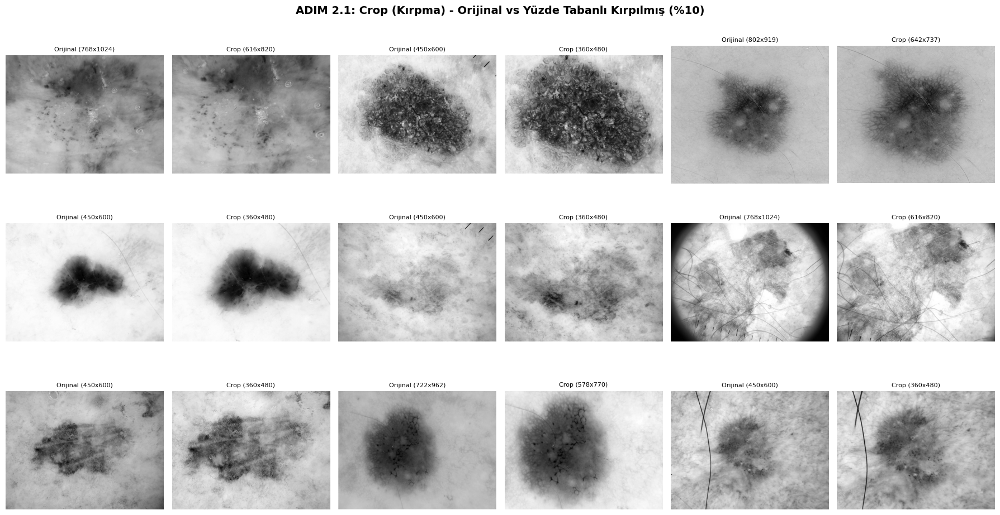

In [92]:
# Crop Görselleştirmesi (9 Örnek)
print("ADIM 2.1: CROP (Kırpma)")
print("-" * 60)

fig, axes = plt.subplots(3, 6, figsize=(18, 10))

for idx, (img_path, label_name) in enumerate(samples):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        continue

    img_gray = rgb_to_gray(img_bgr)
    # Dinamik kırpma yerine %10'luk kırpma uygulandı
    img_crop = crop_image(img_gray, strategy="percentage", percentage=0.10)

    row = idx // 3
    col = (idx % 3) * 2

    # Orijinal
    axes[row, col].imshow(img_gray, cmap='gray')
    axes[row, col].set_title(f'Orijinal ({img_gray.shape[0]}x{img_gray.shape[1]})', fontsize=8)
    axes[row, col].axis('off')

    # Crop edilmiş
    axes[row, col + 1].imshow(img_crop, cmap='gray')
    axes[row, col + 1].set_title(f'Crop ({img_crop.shape[0]}x{img_crop.shape[1]})', fontsize=8)
    axes[row, col + 1].axis('off')

plt.suptitle('ADIM 2.1: Crop (Kırpma) - Orijinal vs Yüzde Tabanlı Kırpılmış (%10)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "step2_1_crop_percentage.png"), dpi=150, bbox_inches='tight')
plt.show()

### Adım 2.1 - Crop Yorumu

**Crop Stratejisi:** Sabit Yüzde Kırpma

İlk olarak farklı boyutlardaki vinyetlere ve siyah kenarlara adapte olabileceği ve lezyonun her zaman en büyük kontur içinde oldup korunacağından dolayı Dinamik kırpma uygulandı.

Dinamik kırpmada örneklerin hiçbirinde orijinal görüntü ile piksellerde fark olmadı.
Muhtemelen görüntü kenarlarında noise artifact olduğu için dinamik kırpma çalışmadı.

## 2.2 KONTRAST İYİLEŞTİRME

Lezyon ve deri arasındaki kontrastı artırmak için kontrast iyileştirme uygulanır.

In [93]:
def contrast_enhancement(img_gray, method="stretching"):
    """
    Kontrast iyileştirme uygular.

    method 'stretching': Percentil tabanlı lineer germe (p2-p98)
    method 'equalization': Histogram eşitleme
    """
    if method == "stretching":
        # Percentil tabanlı germe - outlier'lara karşı dayanıklı
        p2, p98 = np.percentile(img_gray, (2, 98))
        img_rescale = np.interp(img_gray, (p2, p98), (0, 255)).astype(np.uint8)
        return img_rescale

    elif method == "equalization":
        return cv2.equalizeHist(img_gray)

    return img_gray

ADIM 2.2: KONTRAST İYİLEŞTİRME - Histogram Analizi
------------------------------------------------------------

Örnek 1 - melanoma:


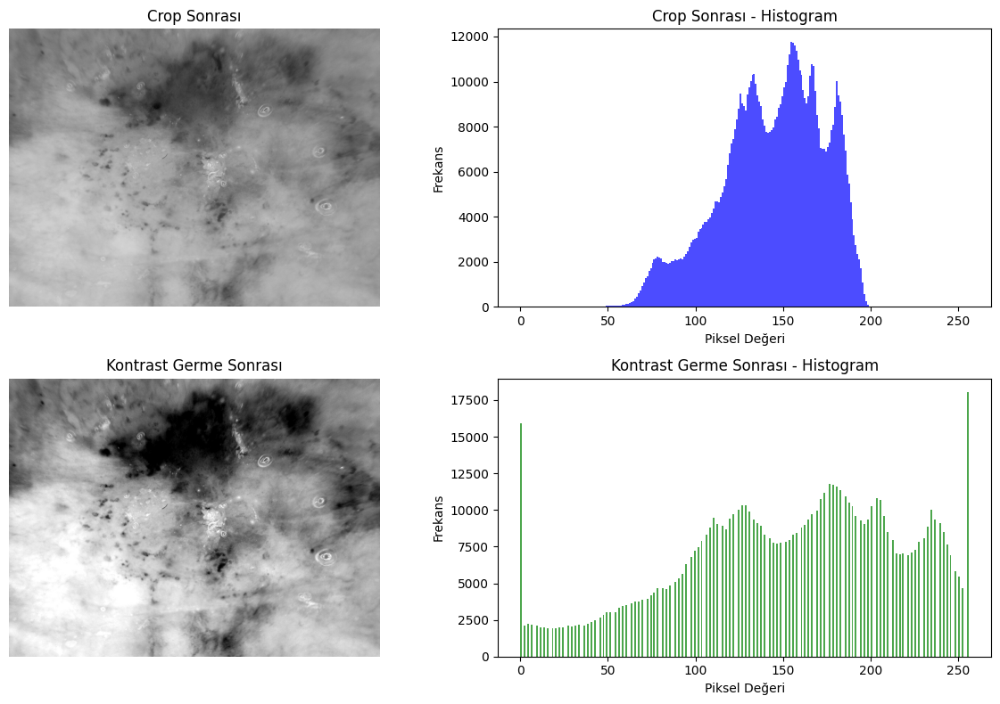


Örnek 2 - pigmented benign keratosis:


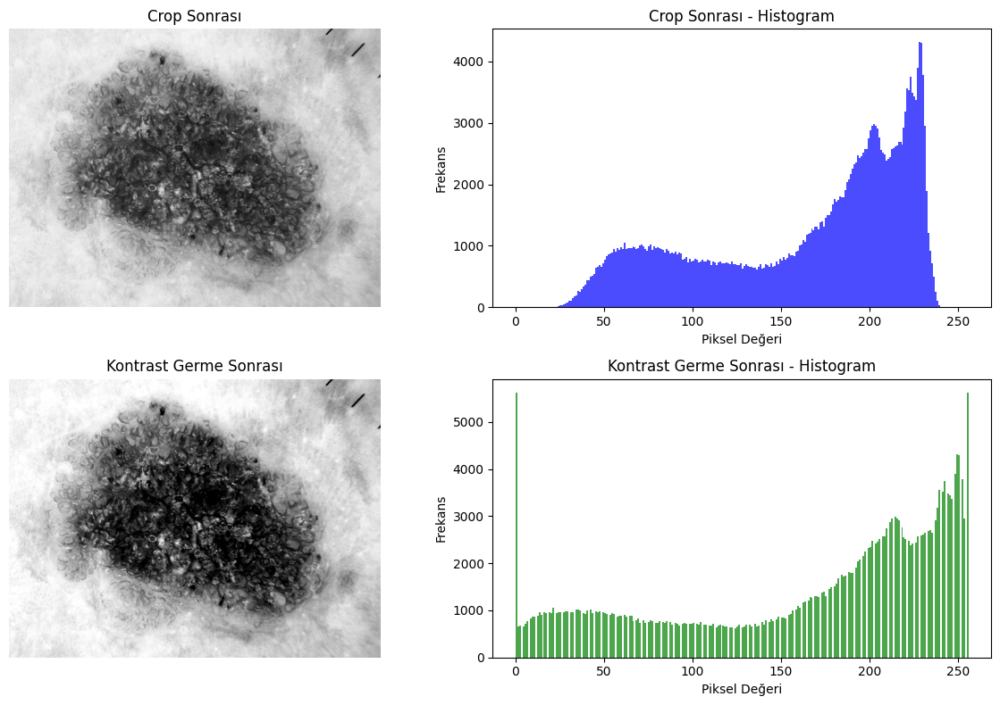


Örnek 3 - nevus:


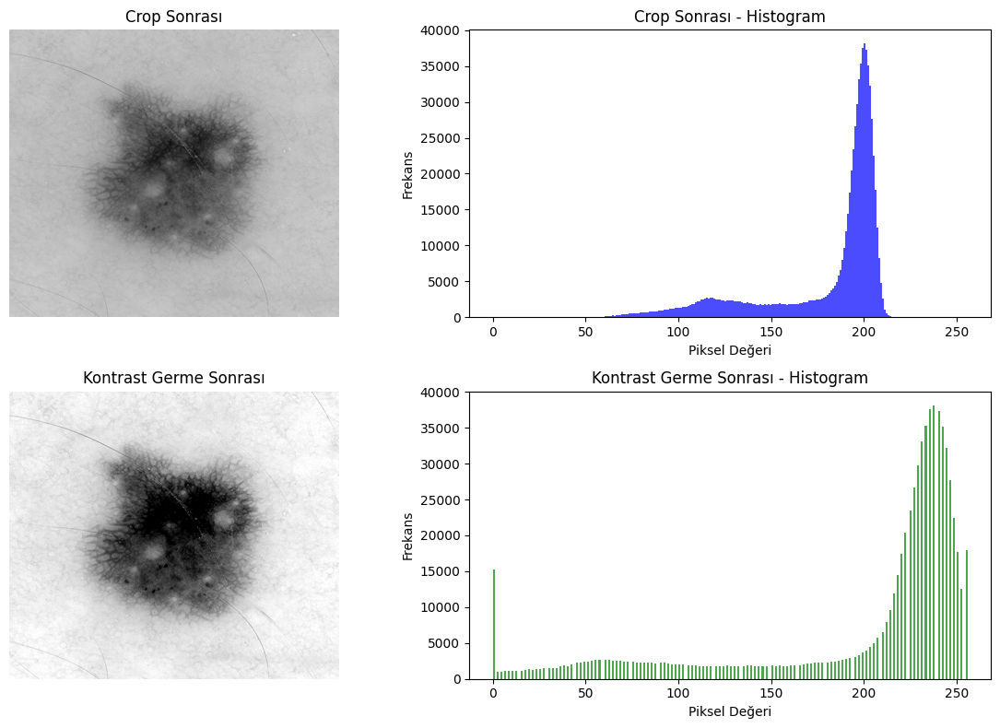

In [94]:
# Kontrast İyileştirme - Histogram Karşılaştırması (3 Örnek)
print("ADIM 2.2: KONTRAST İYİLEŞTİRME - Histogram Analizi")
print("-" * 60)

for idx, (img_path, label_name) in enumerate(samples[:3]):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        continue

    img_gray = rgb_to_gray(img_bgr)
    img_crop = crop_image(img_gray)
    img_contrast = contrast_enhancement(img_crop, method="stretching")

    print(f"\nÖrnek {idx+1} - {label_name}:")
    show_histogram_comparison(img_crop, img_contrast, "Crop Sonrası", "Kontrast Germe Sonrası")

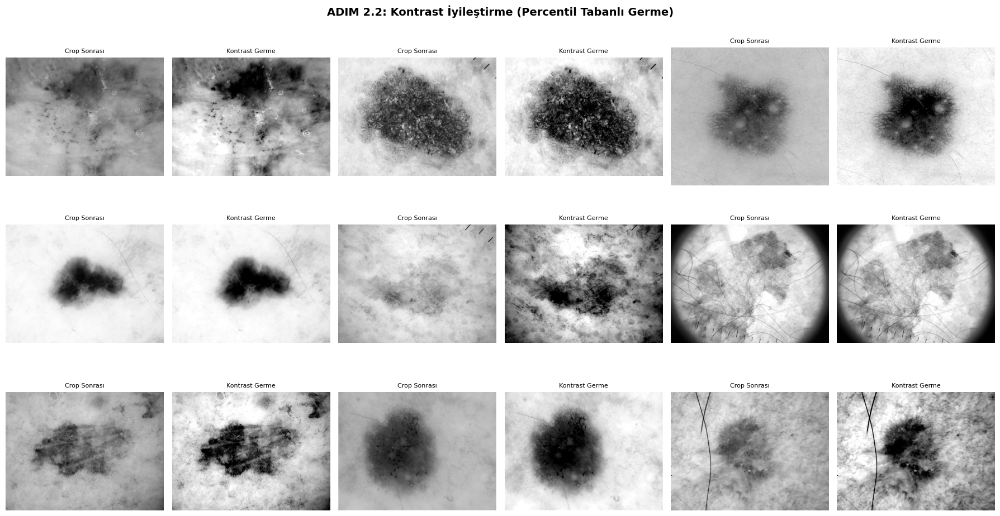

In [95]:
# Kontrast İyileştirme - 9 Örnek Grid
fig, axes = plt.subplots(3, 6, figsize=(18, 10))

for idx, (img_path, label_name) in enumerate(samples):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        continue

    img_gray = rgb_to_gray(img_bgr)
    img_crop = crop_image(img_gray)
    img_contrast = contrast_enhancement(img_crop, method="stretching")

    row = idx // 3
    col = (idx % 3) * 2

    axes[row, col].imshow(img_crop, cmap='gray')
    axes[row, col].set_title('Crop Sonrası', fontsize=8)
    axes[row, col].axis('off')

    axes[row, col + 1].imshow(img_contrast, cmap='gray')
    axes[row, col + 1].set_title('Kontrast Germe', fontsize=8)
    axes[row, col + 1].axis('off')

plt.suptitle('ADIM 2.2: Kontrast İyileştirme (Percentil Tabanlı Germe)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "step2_2_contrast.png"), dpi=150, bbox_inches='tight')
plt.show()

### Adım 2.2 - Kontrast İyileştirme Yorumu

**Seçilen Yöntem:** Kontrast Germe (Percentil Tabanlı - p2, p98)

**Gerekçe:**
1. **Histogram Eşitleme vs Kontrast Germe:**
   - Histogram eşitleme bazı görüntülerde aşırı kontrast artışına neden olabilir
   - Düşük kontrastlı bölgelerde gürültü artabilir
   
2. **Percentil Tabanlı Germe Avantajları:**
   - p2 ve p98 kullanarak outlier'lara (aşırı parlak/koyu pikseller) karşı dayanıklı
   - Lezyon-deri kontrastını artırırken doğal görünümü korur
   - Dermoskopi görüntülerindeki düşük kontrast sorununu kontrollü şekilde çözer

3. **Histogram Gözlemi:**
   - Öncesi: Histogram dar bir aralıkta yoğunlaşmış
   - Sonrası: Histogram 0-255 aralığına yayılmış, kontrast artmış

## 2.3 GÜRÜLTÜ AZALTMA (Blurring)

Segmentasyon öncesi gürültüyü azaltmak için blur filtresi uygulanır.

In [96]:
def apply_blur(img_gray, method="median", kernel_size=5):
    """
    Gürültü azaltma için blur uygular.

    method 'median': Median blur - salt-pepper gürültüsüne karşı etkili
    method 'gaussian': Gaussian blur - genel yumuşatma
    """
    if method == "median":
        return cv2.medianBlur(img_gray, kernel_size)
    elif method == "gaussian":
        return cv2.GaussianBlur(img_gray, (kernel_size, kernel_size), 0)

    return img_gray

ADIM 2.3: GÜRÜLTÜ AZALTMA (Blurring)
------------------------------------------------------------


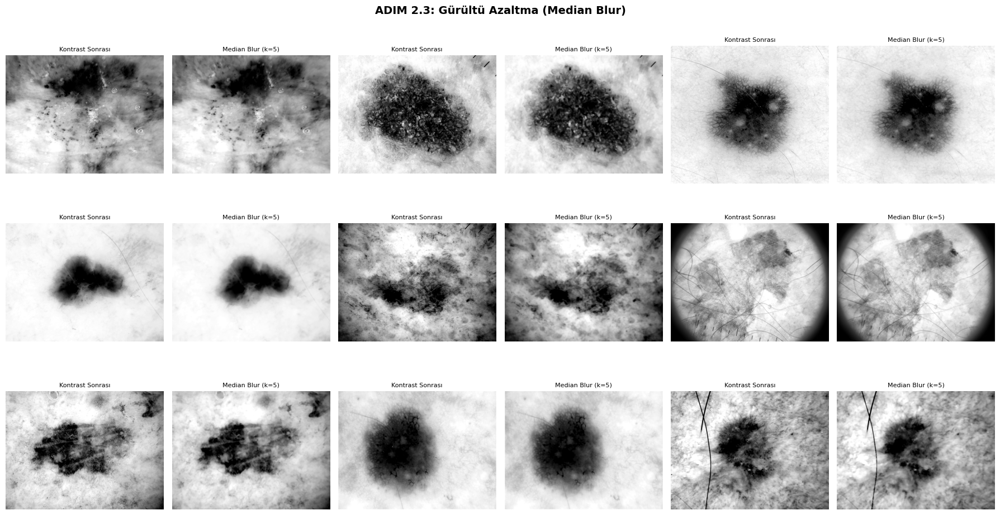

In [97]:
# Blur Görselleştirmesi (9 Örnek)
print("ADIM 2.3: GÜRÜLTÜ AZALTMA (Blurring)")
print("-" * 60)

fig, axes = plt.subplots(3, 6, figsize=(18, 10))

for idx, (img_path, label_name) in enumerate(samples):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        continue

    img_gray = rgb_to_gray(img_bgr)
    img_crop = crop_image(img_gray)
    img_contrast = contrast_enhancement(img_crop)
    img_blur = apply_blur(img_contrast, method="median", kernel_size=5)

    row = idx // 3
    col = (idx % 3) * 2

    axes[row, col].imshow(img_contrast, cmap='gray')
    axes[row, col].set_title('Kontrast Sonrası', fontsize=8)
    axes[row, col].axis('off')

    axes[row, col + 1].imshow(img_blur, cmap='gray')
    axes[row, col + 1].set_title('Median Blur (k=5)', fontsize=8)
    axes[row, col + 1].axis('off')

plt.suptitle('ADIM 2.3: Gürültü Azaltma (Median Blur)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "step2_3_blur.png"), dpi=150, bbox_inches='tight')
plt.show()

### Adım 2.3 - Gürültü Azaltma Yorumu

**Seçilen Yöntem:** Median Blur (kernel_size=5)

**Gerekçe:**
1. **Median Blur vs Gaussian Blur:**
   - Median blur kenar koruyucu bir filtredir
   - Gaussian blur kenarları bulanıklaştırabilir
   
2. **Median Blur Avantajları:**
   - Salt-pepper tipi gürültüyü etkili şekilde temizler
   - Lezyon sınırlarını daha iyi korur
   - Dermoskopi görüntülerindeki kıl/tüy izlerini yumuşatır

3. **Kernel Boyutu Seçimi (5x5):**
   - Küçük kernel: yetersiz gürültü azaltma
   - Büyük kernel: aşırı detay kaybı
   - 5x5: gürültü azaltma ile detay kaybı arasında denge

---
# ADIM 3: THRESHOLDING İLE SEGMENTASYON

Lezyon bölgesini arka plandan ayıran binary maske üretilir.

In [98]:
def apply_thresholding(img_gray, verbose=False):
    """
    Farklı thresholding yöntemlerini uygular ve binary maskeler döndürür.

    Yöntemler:
    1. Global Thresholding (sabit eşik=127)
    2. Otsu's Thresholding (otomatik optimal eşik)
    3. Triangle Thresholding (tek modlu histogramlar için)
    """
    results = {}
    thresholds = {}

    # 1. Global Thresholding (Sabit eşik = 127)
    ret_global, mask_global = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY_INV)
    results["Global (127)"] = mask_global
    thresholds["Global"] = 127

    # 2. Otsu's Thresholding
    ret_otsu, mask_otsu = cv2.threshold(img_gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    results["Otsu"] = mask_otsu
    thresholds["Otsu"] = ret_otsu

    # 3. Triangle Thresholding (skimage)
    thresh_tri = threshold_triangle(img_gray)
    mask_tri = img_gray < thresh_tri
    mask_tri = img_as_ubyte(mask_tri)
    results["Triangle"] = mask_tri
    thresholds["Triangle"] = thresh_tri

    if verbose:
        print(f"  Eşik Değerleri:")
        print(f"    - Global: 127 (sabit)")
        print(f"    - Otsu: {ret_otsu:.2f} (otomatik)")
        print(f"    - Triangle: {thresh_tri:.2f} (otomatik)")

    return mask_otsu, results, thresholds

ADIM 3: THRESHOLDING İLE SEGMENTASYON
  Eşik Değerleri:
    - Global: 127 (sabit)
    - Otsu: 144.00 (otomatik)
    - Triangle: 254.00 (otomatik)


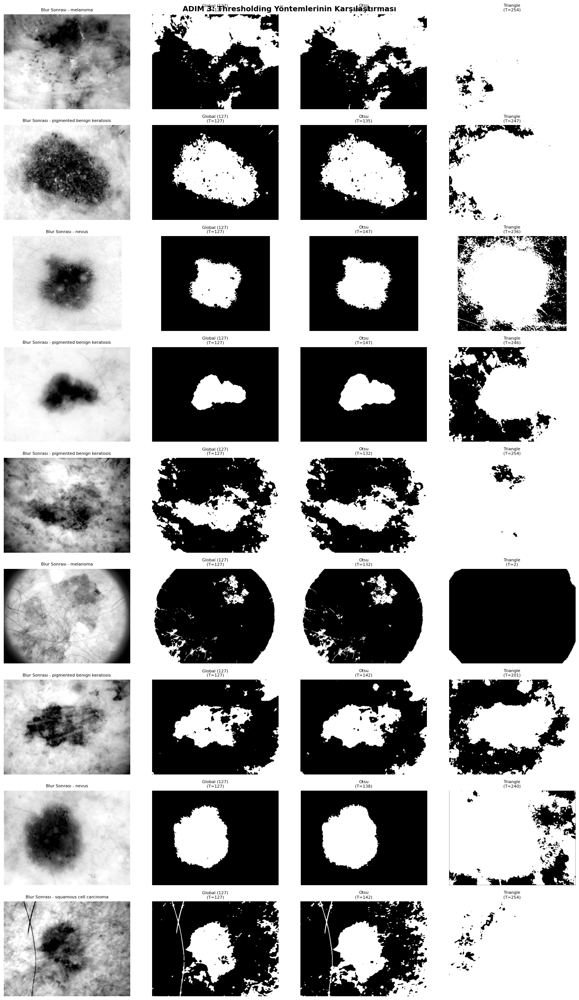

In [99]:
# Thresholding Karşılaştırması (9 Örnek)
print("ADIM 3: THRESHOLDING İLE SEGMENTASYON")
print("=" * 60)

all_thresholds = {"Global": [], "Otsu": [], "Triangle": []}

fig, axes = plt.subplots(9, 4, figsize=(16, 27))

for idx, (img_path, label_name) in enumerate(samples):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        continue

    # Pre-processing pipeline
    img_gray = rgb_to_gray(img_bgr)
    img_crop = crop_image(img_gray)
    img_contrast = contrast_enhancement(img_crop)
    img_blur = apply_blur(img_contrast)

    # Thresholding
    _, results, thresholds = apply_thresholding(img_blur, verbose=(idx == 0))

    # Eşik değerlerini topla
    for method, val in thresholds.items():
        all_thresholds[method].append(val)

    # Görselleştirme
    axes[idx, 0].imshow(img_blur, cmap='gray')
    axes[idx, 0].set_title(f'Blur Sonrası - {label_name}', fontsize=8)
    axes[idx, 0].axis('off')

    for j, (method_name, mask) in enumerate(results.items()):
        axes[idx, j+1].imshow(mask, cmap='gray')
        thresh_val = thresholds[method_name.split()[0]]
        axes[idx, j+1].set_title(f'{method_name}\n(T={thresh_val:.0f})', fontsize=8)
        axes[idx, j+1].axis('off')

plt.suptitle('ADIM 3: Thresholding Yöntemlerinin Karşılaştırması', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "step3_thresholding_comparison.png"), dpi=150, bbox_inches='tight')
plt.show()


In [100]:
# Eşik Değerleri Özet Tablosu
print("\nEŞİK DEĞERLERİ ÖZETİ (9 Örnek):")
print("-" * 50)
print(f"{'Yöntem':<15} {'Min':<10} {'Max':<10} {'Ortalama':<10}")
print("-" * 50)
for method, values in all_thresholds.items():
    print(f"{method:<15} {min(values):<10.2f} {max(values):<10.2f} {np.mean(values):<10.2f}")



EŞİK DEĞERLERİ ÖZETİ (9 Örnek):
--------------------------------------------------
Yöntem          Min        Max        Ortalama  
--------------------------------------------------
Global          127.00     127.00     127.00    
Otsu            132.00     147.00     139.89    
Triangle        2.00       254.00     214.89    


### Adım 3 - Thresholding Yorumu

**Seçilen Yöntem:** Otsu's Thresholding

**Yöntem Karşılaştırması:**

| Yöntem | Avantaj | Dezavantaj |
|--------|---------|------------|
| Global (127) | Basit, hızlı | Her görüntüye uygun değil |
| Otsu | Otomatik, bimodal için optimal | Multimodal histogramlarda sorunlu |
| Triangle | Tek modlu histogramlar için iyi | Bimodal için optimal değil |

**Otsu Seçim Gerekçesi:**
1. Deri ve lezyon iki belirgin mod oluşturur (bimodal histogram)
2. Otsu yöntemi bu iki modu otomatik olarak ayırır
3. Farklı aydınlatma koşullarına adapte olur
4. Eşik değeri her görüntü için optimal şekilde hesaplanır

**Gözlem:**
- Global thresholding bazı görüntülerde aşırı/yetersiz segmentasyon
- Triangle yöntemi lezyon sınırlarını tam yakalayamıyor
- Otsu en tutarlı sonuçları veriyor

---
# ADIM 4: POST-PROCESSING

## 4.1 MORFOLOJİK OPERATÖRLER

Binary maske üzerinde morfolojik operasyonlar uygulanarak gürültü temizlenir ve ROI düzeltilir.

In [101]:
def apply_morphology(mask, kernel_shape="ellipse", kernel_size=5):
    """
    Binary maske üzerinde morfolojik operasyonlar uygular.

    Strateji:
    1. Closing: Lezyon içindeki delikleri doldurur (Dilation -> Erosion)
    2. Opening: Küçük gürültü noktalarını temizler (Erosion -> Dilation)

    Kernel: Elliptik (Disk) - lezyon şekline daha uygun
    """
    if kernel_shape == "ellipse":
        kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (kernel_size, kernel_size))
    elif kernel_shape == "rect":
        kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (kernel_size, kernel_size))
    else:
        kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (kernel_size, kernel_size))

    # Closing: Delikleri doldur
    mask_closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

    # Opening: Gürültüyü temizle
    mask_opened = cv2.morphologyEx(mask_closed, cv2.MORPH_OPEN, kernel)

    return mask_opened

ADIM 4.1: MORFOLOJİK OPERATÖRLER


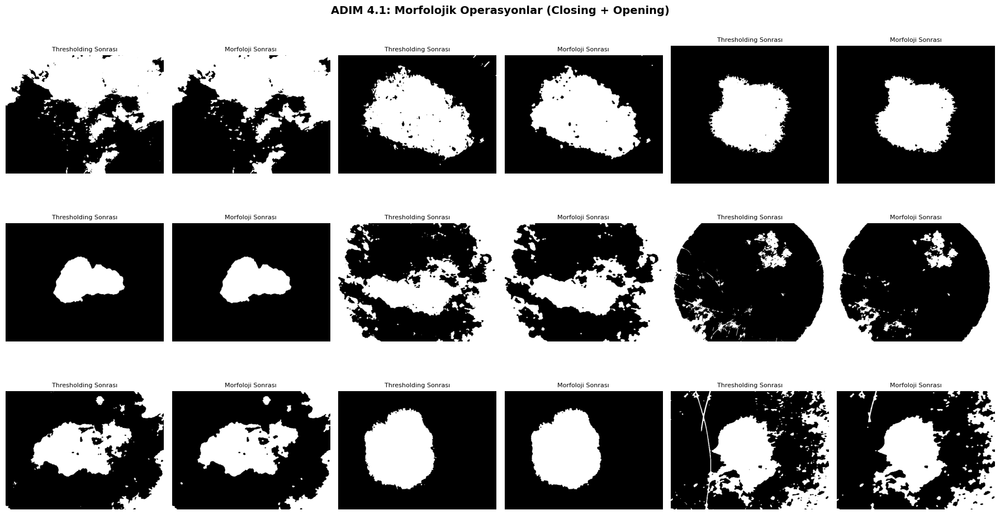

In [102]:
# Morfoloji Görselleştirmesi (9 Örnek)
print("ADIM 4.1: MORFOLOJİK OPERATÖRLER")
print("=" * 60)

fig, axes = plt.subplots(3, 6, figsize=(18, 10))

for idx, (img_path, label_name) in enumerate(samples):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        continue

    # Pipeline
    img_gray = rgb_to_gray(img_bgr)
    img_crop = crop_image(img_gray)
    img_contrast = contrast_enhancement(img_crop)
    img_blur = apply_blur(img_contrast)
    mask_otsu, _, _ = apply_thresholding(img_blur)
    mask_morph = apply_morphology(mask_otsu)

    row = idx // 3
    col = (idx % 3) * 2

    axes[row, col].imshow(mask_otsu, cmap='gray')
    axes[row, col].set_title('Thresholding Sonrası', fontsize=8)
    axes[row, col].axis('off')

    axes[row, col + 1].imshow(mask_morph, cmap='gray')
    axes[row, col + 1].set_title('Morfoloji Sonrası', fontsize=8)
    axes[row, col + 1].axis('off')

plt.suptitle('ADIM 4.1: Morfolojik Operasyonlar (Closing + Opening)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "step4_1_morphology.png"), dpi=150, bbox_inches='tight')
plt.show()

### Adım 4.1 - Morfoloji Yorumu

**Uygulanan Operatörler:**
1. **Closing** (Dilation → Erosion): Lezyon içindeki delikleri doldurur
2. **Opening** (Erosion → Dilation): Küçük gürültü noktalarını temizler

**Kernel Seçimi:**
- **Tip:** Elliptik (Disk)
- **Boyut:** 5x5

**Gerekçe:**
1. **Neden Elliptik Kernel?**
   - Lezyonlar genellikle yuvarlak/oval şekillidir
   - Dikdörtgen kernel köşeli artifaktlar oluşturabilir
   - Disk şekli doğal lezyon sınırlarını daha iyi korur

2. **Neden 5x5 Boyut?**
   - Küçük kernel: yetersiz delik doldurma
   - Büyük kernel: ROI şeklini bozabilir
   - 5x5: gürültü temizleme ile şekil koruma dengesi

3. **Operasyon Sırası:**
   - Önce Closing: iç delikleri doldurarak ROI bütünlüğünü sağlar
   - Sonra Opening: dış gürültüyü temizler

## 4.2 CONNECTED COMPONENT LABELING (CCL)

Morfoloji sonrası maskede bağlı bileşenler etiketlenir ve en büyük bileşen ROI olarak seçilir.

In [103]:
def apply_ccl_and_roi_selection(mask):
    """
    Connected Component Labeling uygular ve en büyük bileşeni seçer.

    Strateji: En büyük alanı seçme
    - Lezyon genellikle en büyük bağlı bileşendir
    - Küçük bileşenler gürültü olarak kabul edilir
    """
    # cv2.connectedComponentsWithStats fonksiyonu:
    #   - num_labels: Toplam bağlı bileşen sayısı (arka plan dahil)
    #   - labels_im: Her pikselin ait olduğu bileşenin etiketini içeren görüntü
    #   - stats: Her bileşen için istatistikler (alan, sınırlayıcı kutu vb.)
    #   - centroids: Her bileşenin merkez koordinatları
    num_labels, labels_im, stats, centroids = cv2.connectedComponentsWithStats(mask)

    # Arka plan bileşeni 0 etiketiyle gelir, bu yüzden toplam bileşen sayısından 1 çıkarılır
    num_components = num_labels - 1

    if num_components == 0:
        # Eğer maskede hiçbir bileşen bulunamazsa, boş bir maske döndür
        return np.zeros_like(mask), 0, labels_im

    # En büyük bileşeni bulma:
    # stats dizisi 0. indiste arka planı içerir, bu yüzden 1'den başlayarak en büyük alanı ararız.
    # np.argmax, en büyük alanın indeksini verir (stats[1:] içindeki indeks).
    # 1 eklememizin nedeni, labels_im içindeki gerçek etiket indeksini bulmaktır.
    largest_label = 1 + np.argmax(stats[1:, cv2.CC_STAT_AREA])

    # Sadece en büyük bileşeni içeren maske oluşturma:
    # labels_im görüntüsünde, sadece largest_label etiketine sahip pikselleri 255 (beyaz) yaparız,
    # diğerlerini 0 (siyah) bırakırız.
    roi_mask = (labels_im == largest_label).astype(np.uint8) * 255

    return roi_mask, num_components, labels_im

ADIM 4.2: CONNECTED COMPONENT LABELING (CCL)
------------------------------------------------------------


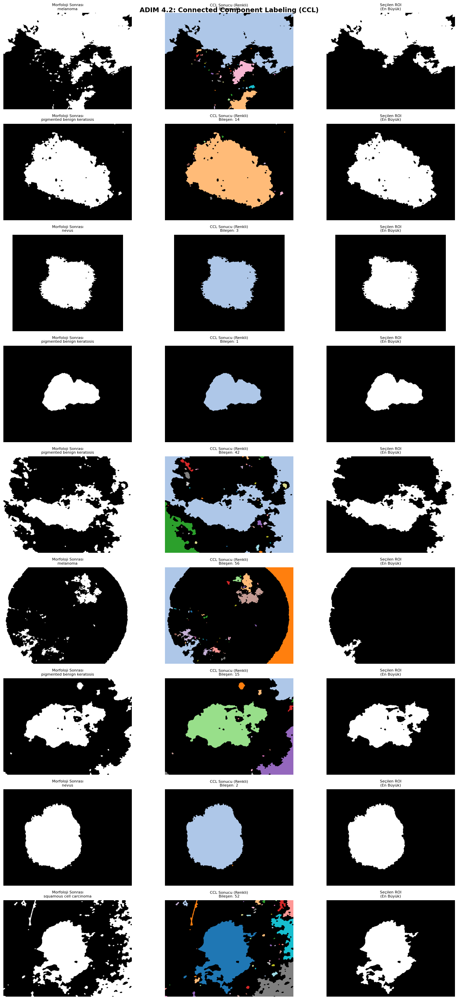


9 Örnek için Bileşen Sayıları: [49, 14, 3, 1, 42, 56, 15, 2, 52]
- 1 bileşen: 1 görüntü
- 2+ bileşen: 8 görüntü


In [104]:
# CCL Görselleştirmesi (9 Örnek)
print("ADIM 4.2: CONNECTED COMPONENT LABELING (CCL)")
print("-" * 60)

component_counts = []

fig, axes = plt.subplots(9, 3, figsize=(15, 30))

for idx, (img_path, label_name) in enumerate(samples):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        continue

    # Pipeline
    img_gray = rgb_to_gray(img_bgr)
    img_crop = crop_image(img_gray)
    img_contrast = contrast_enhancement(img_crop)
    img_blur = apply_blur(img_contrast)
    mask_otsu, _, _ = apply_thresholding(img_blur)
    mask_morph = apply_morphology(mask_otsu)
    roi_mask, num_comps, labels_im = apply_ccl_and_roi_selection(mask_morph)

    component_counts.append(num_comps)

    # Renkli label görüntüsü
    colored_labels = np.zeros((*labels_im.shape, 3), dtype=np.uint8)
    for i in range(1, labels_im.max() + 1):
        color = plt.cm.tab20(i % 20)[:3]
        colored_labels[labels_im == i] = [int(c * 255) for c in color]

    # Görselleştirme
    axes[idx, 0].imshow(mask_morph, cmap='gray')
    axes[idx, 0].set_title(f'Morfoloji Sonrası\n{label_name}', fontsize=8)
    axes[idx, 0].axis('off')

    axes[idx, 1].imshow(colored_labels)
    axes[idx, 1].set_title(f'CCL Sonucu (Renkli)\nBileşen: {num_comps}', fontsize=8)
    axes[idx, 1].axis('off')

    axes[idx, 2].imshow(roi_mask, cmap='gray')
    axes[idx, 2].set_title('Seçilen ROI\n(En Büyük)', fontsize=8)
    axes[idx, 2].axis('off')

plt.suptitle('ADIM 4.2: Connected Component Labeling (CCL)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "step4_2_ccl.png"), dpi=150, bbox_inches='tight')
plt.show()

# Bileşen sayısı özeti
print(f"\n9 Örnek için Bileşen Sayıları: {component_counts}")
print(f"- 1 bileşen: {component_counts.count(1)} görüntü")
print(f"- 2+ bileşen: {sum(1 for c in component_counts if c > 1)} görüntü")

### Adım 4.2 - CCL Yorumu

**ROI Seçim Stratejisi:** En Büyük Bileşeni Seç

**Gerekçe:**
1. Lezyon genellikle görüntüdeki en büyük bağlı bileşendir
2. Küçük bileşenler genellikle:
   - Gürültü
   - Kıl/tüy kalıntıları
   - Yanlış segmente edilmiş küçük bölgeler
3. Bu strateji "1 görüntü = 1 ROI" hedefini garantiler

**Bileşen Sayısı > 1 Durumunda:**
- Eğer birden fazla bileşen varsa, bunlar genellikle gürültü
- Nadiren lezyon parçaları ayrı bileşenler olabilir (kenar kopukluğu)
- En büyük bileşen seçimi bu durumları ele alır

---
# FİNAL: ROI OVERLAY VİZUALİZASYONU

Segmentasyon maskesi RGB görüntü üzerine overlay olarak gösterilir.

In [105]:
def create_final_overlay(img_bgr, mask):
    """RGB görüntü üzerine ROI maskesini overlay olarak ekler."""
    overlay = img_bgr.copy()
    overlay[mask == 255] = [0, 0, 255]  # BGR formatında kırmızı

    # Alpha blending
    alpha = 0.5
    result = cv2.addWeighted(img_bgr, 1-alpha, overlay, alpha, 0)
    return result

FİNAL: ROI OVERLAY VİZUALİZASYONU


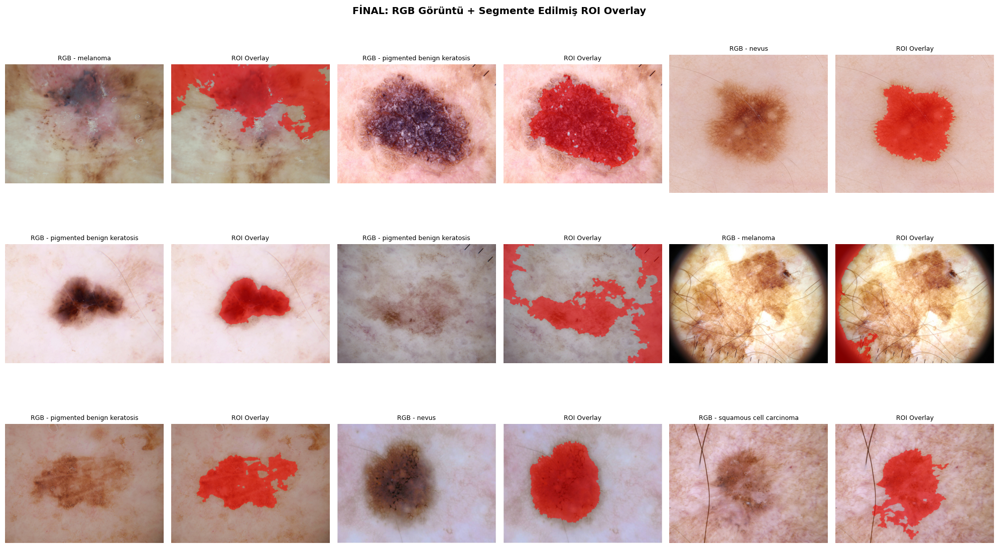

In [106]:
# Final ROI Overlay Görselleştirmesi (9 Örnek)
print("FİNAL: ROI OVERLAY VİZUALİZASYONU")
print("=" * 60)

fig, axes = plt.subplots(3, 6, figsize=(20, 12))

for idx, (img_path, label_name) in enumerate(samples):
    img_bgr = cv2.imread(img_path)
    if img_bgr is None:
        continue

    # Tam pipeline
    img_gray = rgb_to_gray(img_bgr)
    img_crop_gray = crop_image(img_gray)
    img_crop_bgr = crop_image(img_bgr)
    img_contrast = contrast_enhancement(img_crop_gray)
    img_blur = apply_blur(img_contrast)
    mask_otsu, _, _ = apply_thresholding(img_blur)
    mask_morph = apply_morphology(mask_otsu)
    mask_roi, _, _ = apply_ccl_and_roi_selection(mask_morph)

    # Final overlay
    overlay = create_final_overlay(img_crop_bgr, mask_roi)

    row = idx // 3
    col = (idx % 3) * 2

    # Orijinal RGB (crop edilmiş)
    axes[row, col].imshow(cv2.cvtColor(img_crop_bgr, cv2.COLOR_BGR2RGB))
    axes[row, col].set_title(f'RGB - {label_name}', fontsize=9)
    axes[row, col].axis('off')

    # Overlay
    axes[row, col + 1].imshow(cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB))
    axes[row, col + 1].set_title('ROI Overlay', fontsize=9)
    axes[row, col + 1].axis('off')

plt.suptitle('FİNAL: RGB Görüntü + Segmente Edilmiş ROI Overlay', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "final_roi_overlay.png"), dpi=150, bbox_inches='tight')
plt.show()

---
# ADIM 5: ÖZNİTELİK (FEATURE) ÇIKARIMI

ROI üzerinden üç grup öznitelik çıkarılır:
1. First-Order (İstatistiksel) Özellikler
2. 2D Shape (Şekil) Özellikleri
3. GLCM (Second-Order Texture) Özellikleri

In [107]:
def extract_features(img_gray, mask, label_class, image_name):
    """
    Öznitelik çıkarımı yapar.
    """
    features = {"image_id": image_name, "class": label_class}

    # ROI pikselleri
    roi_pixels = img_gray[mask == 255]

    if len(roi_pixels) == 0:
        return None

    # --- 1. FIRST-ORDER (İSTATİSTİKSEL) ÖZELLİKLER ---
    features["mean_intensity"] = np.mean(roi_pixels)
    features["std_intensity"] = np.std(roi_pixels)
    features["variance_intensity"] = np.var(roi_pixels)
    features["min_intensity"] = np.min(roi_pixels)
    features["max_intensity"] = np.max(roi_pixels)
    features["median_intensity"] = np.median(roi_pixels)
    features["skewness"] = skew(roi_pixels)
    features["kurtosis"] = kurtosis(roi_pixels)

    # Entropy ve Energy (histogram tabanlı)
    hist, _ = np.histogram(roi_pixels, bins=256, range=(0, 256), density=True)
    hist = hist[hist > 0]
    features["entropy"] = -np.sum(hist * np.log2(hist)) if len(hist) > 0 else 0
    features["energy_stats"] = np.sum(hist ** 2) if len(hist) > 0 else 0

    # --- 2. 2D SHAPE (ŞEKİL) ÖZELLİKLERİ ---
    lbl = label(mask)
    regions = regionprops(lbl)

    if regions:
        props = regions[0]
        features["area"] = props.area
        features["perimeter"] = props.perimeter
        features["circularity"] = (4 * np.pi * props.area) / (props.perimeter ** 2) if props.perimeter > 0 else 0
        features["eccentricity"] = props.eccentricity
        features["solidity"] = props.solidity
        features["extent"] = props.extent
        features["major_axis_length"] = props.major_axis_length
        features["minor_axis_length"] = props.minor_axis_length
        features["aspect_ratio"] = props.major_axis_length / props.minor_axis_length if props.minor_axis_length > 0 else 0
        features["equivalent_diameter"] = props.equivalent_diameter
        features["convex_area"] = props.convex_area

        # Bounding box ölçüleri
        minr, minc, maxr, maxc = props.bbox
        features["bbox_width"] = maxc - minc
        features["bbox_height"] = maxr - minr
    else:
        return None

    # --- 3. GLCM (SECOND-ORDER TEXTURE) ÖZELLİKLERİ ---
    if regions:
        minr, minc, maxr, maxc = props.bbox
        roi_patch = img_gray[minr:maxr, minc:maxc]

        # Quantization: 32 seviyeye indir
        roi_patch_quant = (roi_patch // 8).astype(np.uint8)
        levels = 32

        distances = [1, 2]
        angles = [0, np.pi/4, np.pi/2, 3*np.pi/4]

        try:
            glcm = graycomatrix(roi_patch_quant, distances=distances, angles=angles,
                               levels=levels, symmetric=True, normed=True)

            features["glcm_contrast"] = np.mean(graycoprops(glcm, 'contrast'))
            features["glcm_dissimilarity"] = np.mean(graycoprops(glcm, 'dissimilarity'))
            features["glcm_homogeneity"] = np.mean(graycoprops(glcm, 'homogeneity'))
            features["glcm_energy"] = np.mean(graycoprops(glcm, 'energy'))
            features["glcm_correlation"] = np.mean(graycoprops(glcm, 'correlation'))
            features["glcm_ASM"] = np.mean(graycoprops(glcm, 'ASM'))
        except:
            features["glcm_contrast"] = 0
            features["glcm_dissimilarity"] = 0
            features["glcm_homogeneity"] = 0
            features["glcm_energy"] = 0
            features["glcm_correlation"] = 0
            features["glcm_ASM"] = 0

    return features

## Batch İşleme - Tüm Görüntüler İçin Öznitelik Çıkarımı

In [108]:
print("#" * 70)
print(f"# BATCH İŞLEME AŞAMASI ({len(all_paths)} Görüntü)")
print("#" * 70)

all_features = []
component_distribution = []

for idx, (img_path, label_name) in enumerate(all_paths):
    if idx % 500 == 0:
        print(f"  İşleniyor: {idx}/{len(all_paths)}...")

    try:
        img_bgr = cv2.imread(img_path)
        if img_bgr is None:
            continue

        # Tam pipeline
        img_gray = rgb_to_gray(img_bgr)
        img_crop_gray = crop_image(img_gray)
        img_contrast = contrast_enhancement(img_crop_gray)
        img_blur = apply_blur(img_contrast)
        mask_otsu, _, _ = apply_thresholding(img_blur)
        mask_morph = apply_morphology(mask_otsu)
        mask_roi, num_comps, _ = apply_ccl_and_roi_selection(mask_morph)

        # Bileşen sayısını kaydet
        component_distribution.append(num_comps)

        # Öznitelik çıkarımı
        img_name = os.path.basename(img_path)
        feats = extract_features(img_crop_gray, mask_roi, label_name, img_name)

        if feats:
            feats["num_components_initial"] = num_comps
            all_features.append(feats)

    except Exception as e:
        # Some images might cause errors (e.g., empty ROI), skip them
        # print(f"  Hata oluştu: {img_path} - {e}") # Uncomment for debugging
        continue

print(f"\n  İşlem tamamlandı: {len(all_features)} görüntü başarıyla işlendi.")

######################################################################
# BATCH İŞLEME AŞAMASI (2357 Görüntü)
######################################################################
  İşleniyor: 0/2357...
  İşleniyor: 500/2357...
  İşleniyor: 1000/2357...
  İşleniyor: 1500/2357...
  İşleniyor: 2000/2357...

  İşlem tamamlandı: 2357 görüntü başarıyla işlendi.


## Sonuçların Kaydedilmesi ve Raporlanması

In [109]:
# DataFrame oluştur ve CSV'ye kaydet
df = pd.DataFrame(all_features)
out_csv = os.path.join(OUTPUT_DIR, "features.csv")
df.to_csv(out_csv, index=False)

print("=" * 70)
print("SONUÇLAR VE ÖZNİTELİK TABLOSU")
print("=" * 70)
print(f"\n✓ Öznitelik tablosu kaydedildi: {out_csv}")

SONUÇLAR VE ÖZNİTELİK TABLOSU

✓ Öznitelik tablosu kaydedildi: /content/output_results/features.csv


In [110]:
# Özet İstatistikler
print("\n  ÖZET İSTATİSTİKLER:")
print("  " + "-" * 50)
print(f"  Toplam görüntü sayısı: {len(all_paths)}")
print(f"  İşlenen görüntü sayısı: {len(df)}")
print(f"  Toplam ROI sayısı: {len(df)} (1 görüntü = 1 ROI)")
print(f"  Öznitelik sayısı: {len(df.columns) - 2} (image_id ve class hariç)")


  ÖZET İSTATİSTİKLER:
  --------------------------------------------------
  Toplam görüntü sayısı: 2357
  İşlenen görüntü sayısı: 2357
  Toplam ROI sayısı: 2357 (1 görüntü = 1 ROI)
  Öznitelik sayısı: 30 (image_id ve class hariç)



  BİLEŞEN SAYISI DAĞILIMI:
  --------------------------------------------------
  1 bileşen: 92 görüntü (3.9%)
  2 bileşen: 89 görüntü (3.8%)
  3 bileşen: 38 görüntü (1.6%)
  4 bileşen: 47 görüntü (2.0%)
  5 bileşen: 57 görüntü (2.4%)
  6 bileşen: 57 görüntü (2.4%)
  7 bileşen: 57 görüntü (2.4%)
  8 bileşen: 40 görüntü (1.7%)
  9 bileşen: 47 görüntü (2.0%)
  10 bileşen: 35 görüntü (1.5%)
  11 bileşen: 35 görüntü (1.5%)
  12 bileşen: 34 görüntü (1.4%)
  13 bileşen: 32 görüntü (1.4%)
  14 bileşen: 25 görüntü (1.1%)
  15 bileşen: 37 görüntü (1.6%)
  16 bileşen: 34 görüntü (1.4%)
  17 bileşen: 25 görüntü (1.1%)
  18 bileşen: 35 görüntü (1.5%)
  19 bileşen: 33 görüntü (1.4%)
  20 bileşen: 36 görüntü (1.5%)
  21 bileşen: 27 görüntü (1.1%)
  22 bileşen: 26 görüntü (1.1%)
  23 bileşen: 37 görüntü (1.6%)
  24 bileşen: 40 görüntü (1.7%)
  25 bileşen: 33 görüntü (1.4%)
  26 bileşen: 28 görüntü (1.2%)
  27 bileşen: 38 görüntü (1.6%)
  28 bileşen: 27 görüntü (1.1%)
  29 bileşen: 32 görüntü (1.4%)


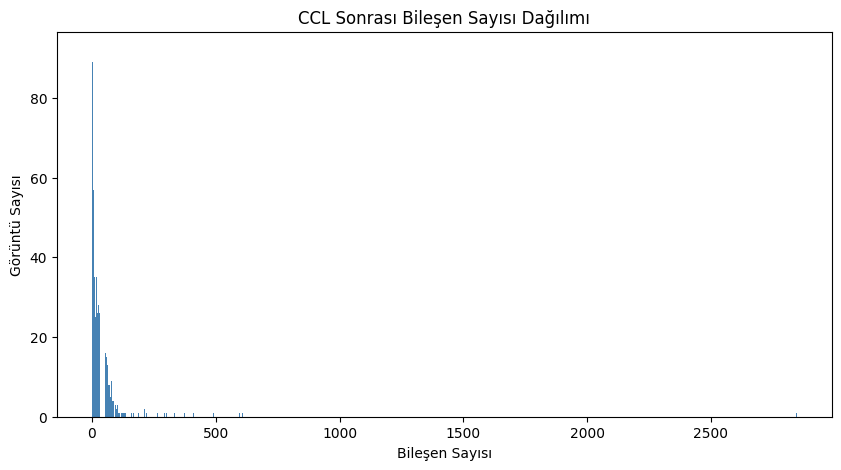

In [120]:
from pandas._libs.tslibs.timedeltas import Components
# Bileşen Dağılımı
comp_counter = Counter(component_distribution)
print("\n  BİLEŞEN SAYISI DAĞILIMI:")
print("  " + "-" * 50)

for comp_count in sorted(comp_counter.keys()):
    percentage = (comp_counter[comp_count] / len(component_distribution)) * 100
    print(f"  {comp_count} bileşen: {comp_counter[comp_count]} görüntü ({percentage:.1f}%)")

# Bileşen dağılımı grafiği
plt.figure(figsize=(10, 5))
plt.bar(comp_counter.keys(), comp_counter.values(), color='steelblue')
plt.xlabel('Bileşen Sayısı')
plt.ylabel('Görüntü Sayısı')
plt.title('CCL Sonrası Bileşen Sayısı Dağılımı')
plt.savefig(os.path.join(OUTPUT_DIR, "component_distribution.png"), dpi=150, bbox_inches='tight')
plt.show()


  SINIF DAĞILIMI:
  --------------------------------------------------
  pigmented benign keratosis: 478 görüntü
  melanoma: 454 görüntü
  basal cell carcinoma: 392 görüntü
  nevus: 373 görüntü
  squamous cell carcinoma: 197 görüntü
  vascular lesion: 142 görüntü
  actinic keratosis: 130 görüntü
  dermatofibroma: 111 görüntü
  seborrheic keratosis: 80 görüntü


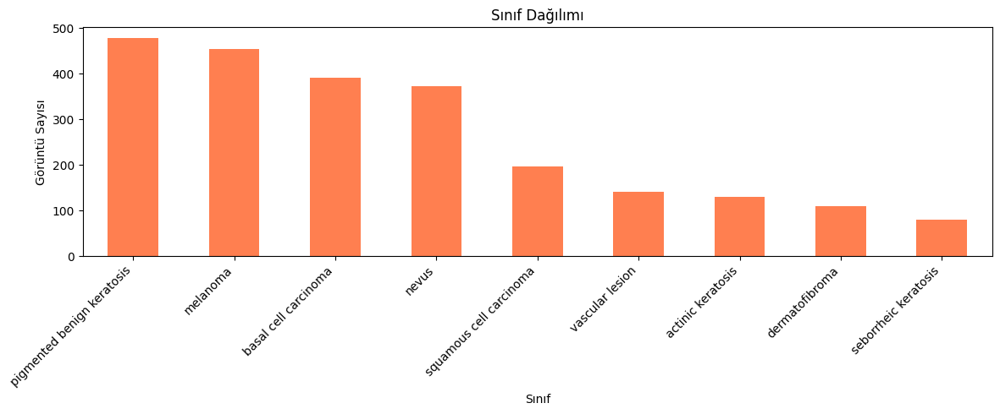

In [121]:
# Sınıf Dağılımı
if not df.empty:
    class_counts = df['class'].value_counts()
    print("\n  SINIF DAĞILIMI:")
    print("  " + "-" * 50)
    for cls, count in class_counts.items():
        print(f"  {cls}: {count} görüntü")

    # Sınıf dağılımı grafiği
    plt.figure(figsize=(12, 5))
    class_counts.plot(kind='bar', color='coral')
    plt.xlabel('Sınıf')
    plt.ylabel('Görüntü Sayısı')
    plt.title('Sınıf Dağılımı')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig(os.path.join(OUTPUT_DIR, "class_distribution.png"), dpi=150, bbox_inches='tight')
    plt.show()

In [122]:
# Öznitelik Listesi
print("\n  ÇIKARILAN ÖZNİTELİKLER:")
print("  " + "-" * 50)

first_order = ['mean_intensity', 'std_intensity', 'variance_intensity', 'min_intensity',
               'max_intensity', 'median_intensity', 'skewness', 'kurtosis', 'entropy', 'energy_stats']
shape_features = ['area', 'perimeter', 'circularity', 'eccentricity', 'solidity', 'extent',
                  'major_axis_length', 'minor_axis_length', 'aspect_ratio', 'equivalent_diameter',
                  'convex_area', 'bbox_width', 'bbox_height']
glcm_features = ['glcm_contrast', 'glcm_dissimilarity', 'glcm_homogeneity',
                 'glcm_energy', 'glcm_correlation', 'glcm_ASM']

print(f"\n  1. First-Order (İstatistiksel) Özellikler ({len(first_order)}):")
for f in first_order:
    print(f"     - {f}")

print(f"\n  2. Shape (Şekil) Özellikleri ({len(shape_features)}):")
for f in shape_features:
    print(f"     - {f}")

print(f"\n  3. GLCM (Texture) Özellikleri ({len(glcm_features)}):")
for f in glcm_features:
    print(f"     - {f}")


  ÇIKARILAN ÖZNİTELİKLER:
  --------------------------------------------------

  1. First-Order (İstatistiksel) Özellikler (10):
     - mean_intensity
     - std_intensity
     - variance_intensity
     - min_intensity
     - max_intensity
     - median_intensity
     - skewness
     - kurtosis
     - entropy
     - energy_stats

  2. Shape (Şekil) Özellikleri (13):
     - area
     - perimeter
     - circularity
     - eccentricity
     - solidity
     - extent
     - major_axis_length
     - minor_axis_length
     - aspect_ratio
     - equivalent_diameter
     - convex_area
     - bbox_width
     - bbox_height

  3. GLCM (Texture) Özellikleri (6):
     - glcm_contrast
     - glcm_dissimilarity
     - glcm_homogeneity
     - glcm_energy
     - glcm_correlation
     - glcm_ASM


In [123]:
# GLCM Parametreleri
print("\n  GLCM PARAMETRELERİ:")
print("  " + "-" * 50)
print("  - Distances: [1, 2]")
print("  - Angles: [0, π/4, π/2, 3π/4]")
print("  - Gri Seviye İndirgeme: 32 seviye (256/8)")
print("  - Symmetric: True")
print("  - Normalized: True")


  GLCM PARAMETRELERİ:
  --------------------------------------------------
  - Distances: [1, 2]
  - Angles: [0, π/4, π/2, 3π/4]
  - Gri Seviye İndirgeme: 32 seviye (256/8)
  - Symmetric: True
  - Normalized: True


In [124]:
# Feature Tablosunun İlk 10 Satırı
print("\n  ÖZNİTELİK TABLOSU (İlk 10 Satır):")
print("  " + "-" * 50)
df.head(10)


  ÖZNİTELİK TABLOSU (İlk 10 Satır):
  --------------------------------------------------


,image_id,class,mean_intensity,std_intensity,variance_intensity,min_intensity,max_intensity,median_intensity,skewness,kurtosis,...,convex_area,bbox_width,bbox_height,glcm_contrast,glcm_dissimilarity,glcm_homogeneity,glcm_energy,glcm_correlation,glcm_ASM,num_components_initial
0,ISIC_0024800.jpg,actinic keratosis,103.211334,18.829517,354.550692,16,138,107.0,-0.747902,-0.068466,...,41141.0,250,251,1.222880,0.662571,0.720052,0.209813,0.933122,0.044152,30
1,ISIC_0024763.jpg,actinic keratosis,143.209555,11.867853,140.845933,82,197,145.0,-0.630233,-0.019789,...,224631.0,600,450,0.307940,0.289109,0.857210,0.254297,0.975924,0.064816,11
2,ISIC_0024654.jpg,actinic keratosis,58.038480,27.050625,731.736339,6,120,47.0,0.526123,-1.103669,...,54024.0,142,450,0.308661,0.287060,0.858552,0.231964,0.995814,0.053870,7
3,ISIC_0024646.jpg,actinic keratosis,161.282253,7.047691,49.669948,114,182,162.0,-1.033695,1.982198,...,102751.0,385,376,0.298320,0.278833,0.862529,0.371828,0.902090,0.138443,54
4,ISIC_0024771.jpg,actinic keratosis,157.192223,8.719418,76.028255,77,209,159.0,-1.503876,3.868821,...,244008.0,600,450,0.325965,0.300662,0.852068,0.324721,0.932816,0.105643,36
5,ISIC_0024707.jpg,actinic keratosis,117.009839,13.977502,195.370561,59,160,119.0,-0.599171,-0.159134,...,213717.0,600,450,0.481310,0.406080,0.804357,0.200935,0.973725,0.040534,53
6,ISIC_0024948.jpg,actinic keratosis,154.859766,25.696127,660.290961,9,188,164.0,-1.566474,1.941443,...,69380.0,220,450,0.529699,0.392865,0.816020,0.245396,0.975439,0.060414,42
7,ISIC_0010512.jpg,actinic keratosis,121.337997,8.919088,79.550127,49,171,123.0,-0.989300,0.940947,...,310782.0,777,466,0.230215,0.193986,0.905717,0.390154,0.944120,0.152348,146
8,ISIC_0025605.jpg,actinic keratosis,137.318006,9.864025,97.298989,102,158,140.0,-0.775354,-0.215125,...,89363.0,202,450,0.314928,0.298929,0.852135,0.286936,0.956620,0.082514,25
9,ISIC_0024470.jpg,actinic keratosis,117.110337,13.492732,182.053824,62,148,120.0,-1.019490,0.774014,...,155928.0,440,450,0.354174,0.332329,0.836016,0.236195,0.974032,0.055947,45


In [125]:
# Feature İstatistikleri
print("\n  ÖZNİTELİK İSTATİSTİKLERİ:")
print("  " + "-" * 50)
df.describe()


  ÖZNİTELİK İSTATİSTİKLERİ:
  --------------------------------------------------


,mean_intensity,std_intensity,variance_intensity,min_intensity,max_intensity,median_intensity,skewness,kurtosis,entropy,energy_stats,...,convex_area,bbox_width,bbox_height,glcm_contrast,glcm_dissimilarity,glcm_homogeneity,glcm_energy,glcm_correlation,glcm_ASM,num_components_initial
count,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,...,2.357000e+03,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000,2357.000000
mean,122.153317,18.656441,404.775945,43.188375,185.509546,123.930632,-0.767835,2.017538,5.888289,0.022555,...,3.184274e+05,496.801867,501.369962,0.672185,0.397146,0.820357,0.238285,0.964134,0.061193,45.260076
std,30.060632,7.532411,339.463993,30.657373,32.682302,32.244345,0.978018,5.518695,0.574917,0.017913,...,9.684937e+05,464.064432,434.457744,0.894724,0.201438,0.068932,0.065647,0.030961,0.034772,98.925551
min,7.524661,3.648347,13.310436,0.000000,84.000000,0.000000,-6.224038,-1.623519,1.704562,0.007459,...,4.546000e+03,57.000000,72.000000,0.066017,0.066012,0.450928,0.085451,0.665828,0.007365,1.000000
25%,105.002701,13.154879,173.050851,18.000000,164.000000,107.000000,-1.261208,-0.500696,5.504524,0.014774,...,6.327900e+04,260.000000,288.000000,0.310632,0.273023,0.785557,0.191308,0.952057,0.036682,11.000000
50%,125.149453,17.347036,300.919663,38.000000,182.000000,128.000000,-0.728693,0.407620,5.914745,0.020043,...,1.087160e+05,382.000000,434.000000,0.453270,0.361773,0.828891,0.231720,0.972130,0.053841,30.000000
75%,143.209555,22.876388,523.329139,65.000000,207.000000,147.000000,-0.188361,2.326564,6.301456,0.026625,...,2.060700e+05,560.000000,488.000000,0.689968,0.462060,0.867016,0.276957,0.985466,0.076809,50.000000
max,206.476401,54.358261,2954.820503,165.000000,255.000000,210.000000,7.637922,78.432667,7.198912,0.518498,...,1.650882e+07,5616.000000,4439.000000,15.910812,2.440617,0.966995,0.546322,0.999314,0.298536,2846.000000


---
# SONUÇ VE DEĞERLENDİRME

## Pipeline Özeti

| Adım | İşlem | Yöntem/Parametre |
|------|-------|------------------|
| 1 | RGB → Grayscale | cv2.cvtColor |
| 2.1 | Crop | Kontur tabanlı dinamik kırpma |
| 2.2 | Kontrast | Percentil germe (p2-p98) |
| 2.3 | Blur | Median blur (k=5) |
| 3 | Thresholding | Otsu (BINARY_INV) |
| 4.1 | Morfoloji | Closing + Opening (Ellipse 5x5) |
| 4.2 | CCL | En büyük bileşen seçimi |
| 5 | Feature | First-Order + Shape + GLCM |

## Öznitelik Özeti

- **First-Order:** 10 özellik (mean, std, variance, min, max, median, skewness, kurtosis, entropy, energy)
- **Shape:** 13 özellik (area, perimeter, circularity, eccentricity, solidity, extent, axis lengths, aspect ratio, equivalent diameter, convex area, bbox)
- **GLCM:** 6 özellik (contrast, dissimilarity, homogeneity, energy, correlation, ASM)

## Kritik Kararlar ve Gerekçeler

1. **Otsu Thresholding:** Bimodal histogram yapısına uygun
2. **Median Blur:** Kenar koruyucu, salt-pepper gürültüsüne etkili
3. **Elliptik Kernel:** Lezyon şekline uygun
4. **En Büyük Bileşen:** "1 görüntü = 1 ROI" garantisi

In [126]:
print("\n" + "=" * 70)
print("İŞLEM TAMAMLANDI!")
print("=" * 70)
print(f"\nÇıktı dizini: {OUTPUT_DIR}")
print("\nOluşturulan dosyalar:")
for f in os.listdir(OUTPUT_DIR):
    print(f"  - {f}")


İŞLEM TAMAMLANDI!

Çıktı dizini: /content/output_results

Oluşturulan dosyalar:
  - step2_1_crop_percentage.png
  - step3_thresholding_comparison.png
  - class_distribution.png
  - final_roi_overlay.png
  - features.csv
  - step1_rgb_to_grayscale.png
  - component_distribution.png
  - step4_2_ccl.png
  - step2_3_blur.png
  - step4_1_morphology.png
  - step2_1_crop.png
  - step2_2_contrast.png
